## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

## One hot encoding and concatenating

In [2]:
vectors = model.docvecs.vectors_docs

In [3]:

one_hot = pd.Categorical(df['Issue'])
df_dummies = pd.get_dummies(one_hot)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies], axis = 1)
print(df_concat.shape)

(58035, 141)


## Applying T-SNE

In [4]:
tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_concat)


In [5]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [6]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


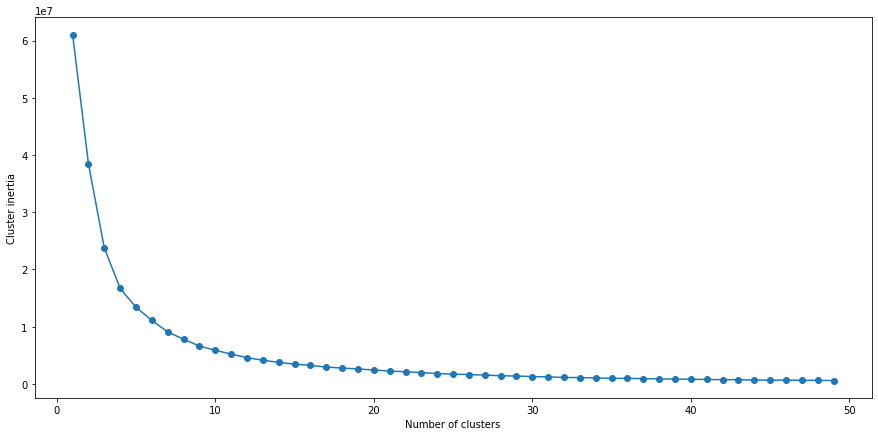

In [7]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.39118955
For n_clusters = 5 The average silhouette_score is : 0.37292346
For n_clusters = 6 The average silhouette_score is : 0.37908846
For n_clusters = 7 The average silhouette_score is : 0.3991895
For n_clusters = 8 The average silhouette_score is : 0.41904315
For n_clusters = 9 The average silhouette_score is : 0.42926043
For n_clusters = 10 The average silhouette_score is : 0.43564242
For n_clusters = 11 The average silhouette_score is : 0.4349317
For n_clusters = 12 The average silhouette_score is : 0.44994134
For n_clusters = 13 The average silhouette_score is : 0.45341113
For n_clusters = 14 The average silhouette_score is : 0.46981755
For n_clusters = 15 The average silhouette_score is : 0.4658616
For n_clusters = 16 The average silhouette_score is : 0.48139653
For n_clusters = 17 The average silhouette_score is : 0.4807003
For n_clusters = 18 The average silhouette_score is : 0.4821615
For n_clusters = 19 The average silh

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.5197864


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.5199925


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.528392


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.53296125


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.5356892


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.51321924


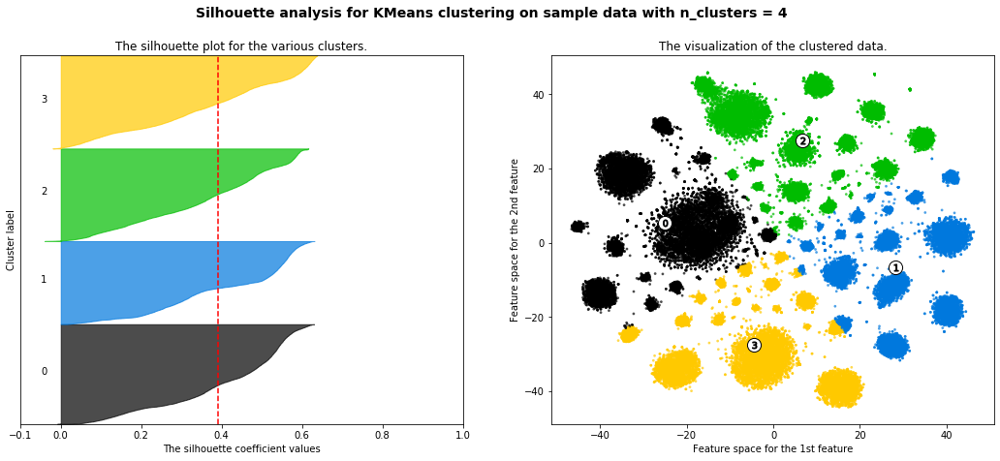

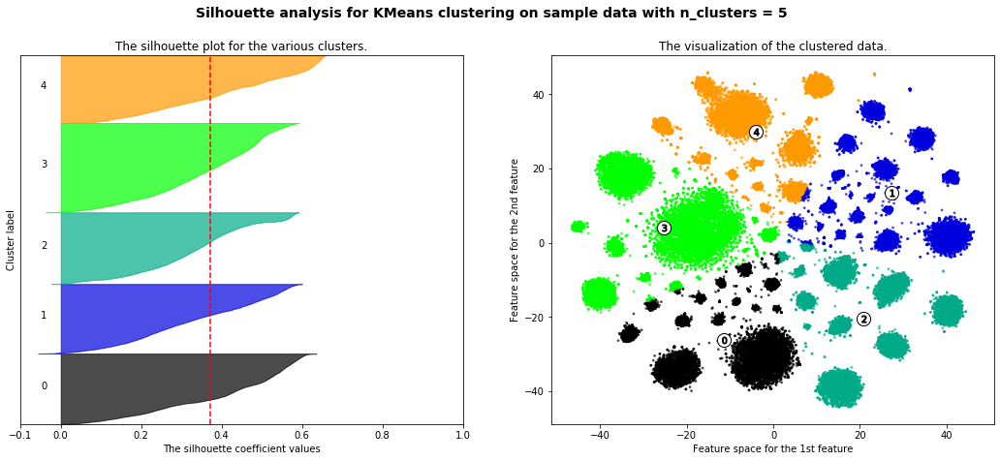

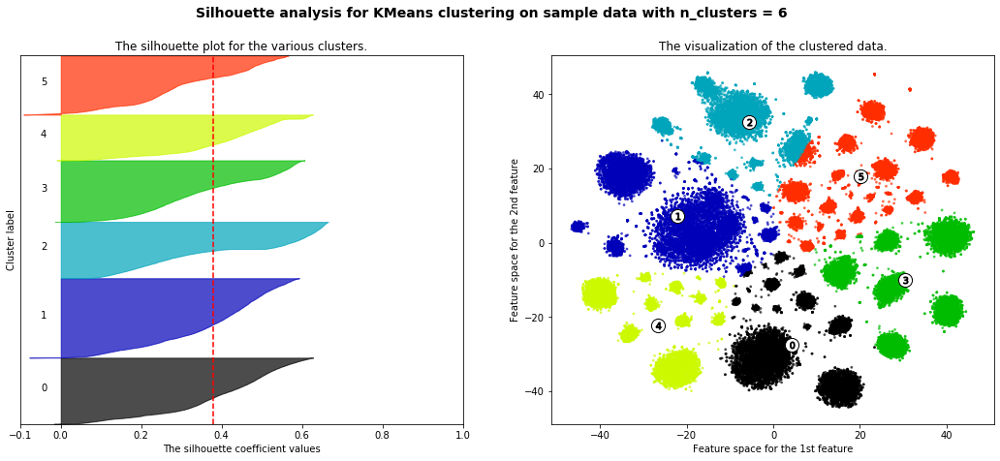

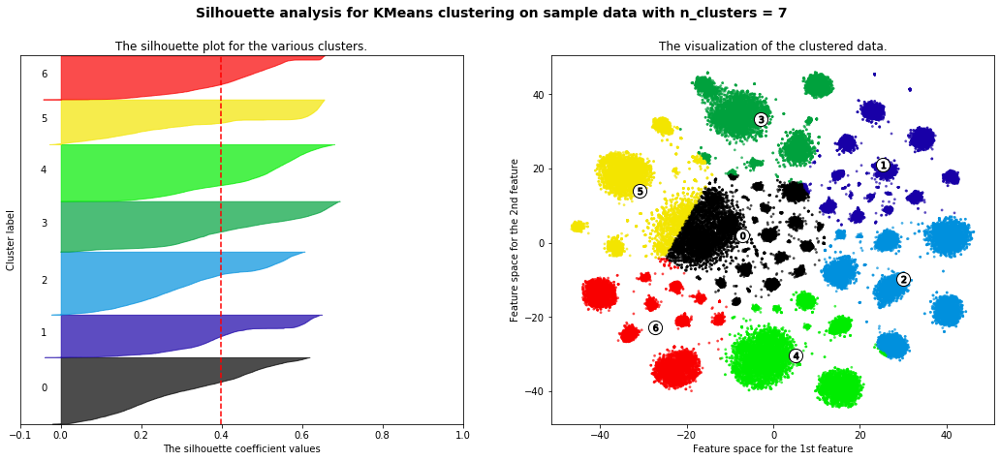

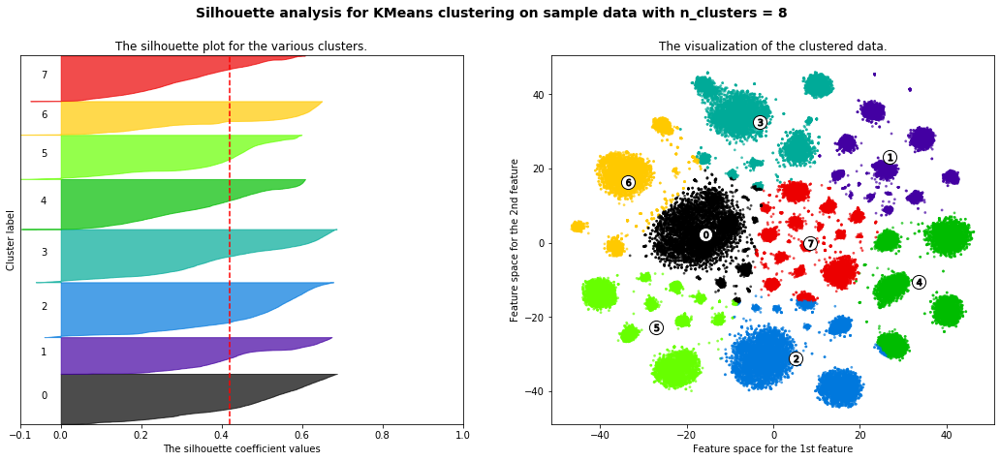

...

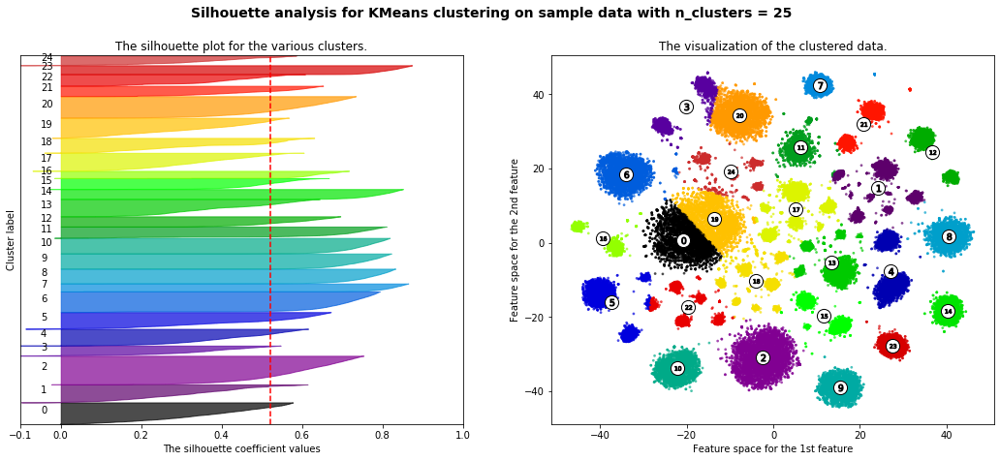

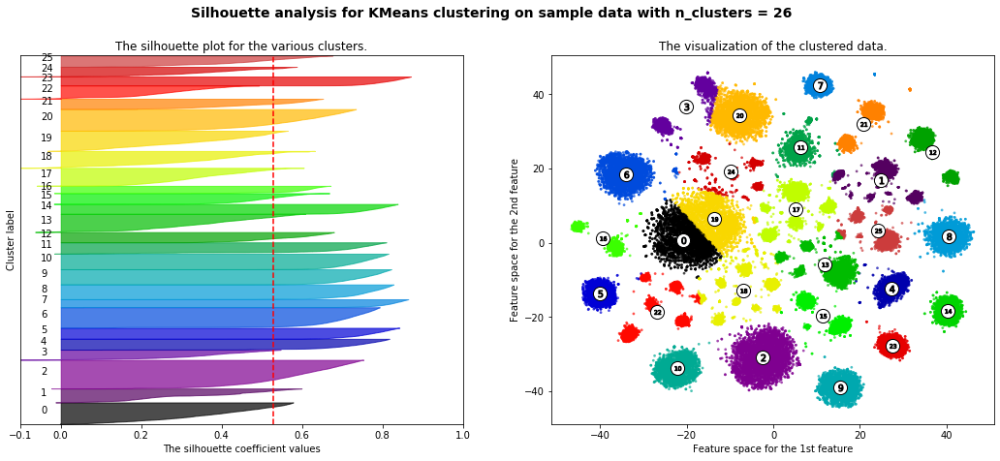

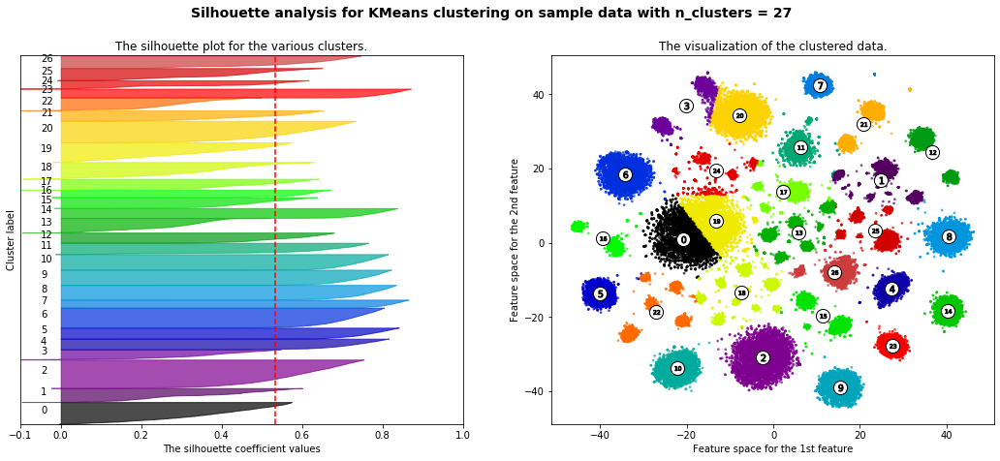

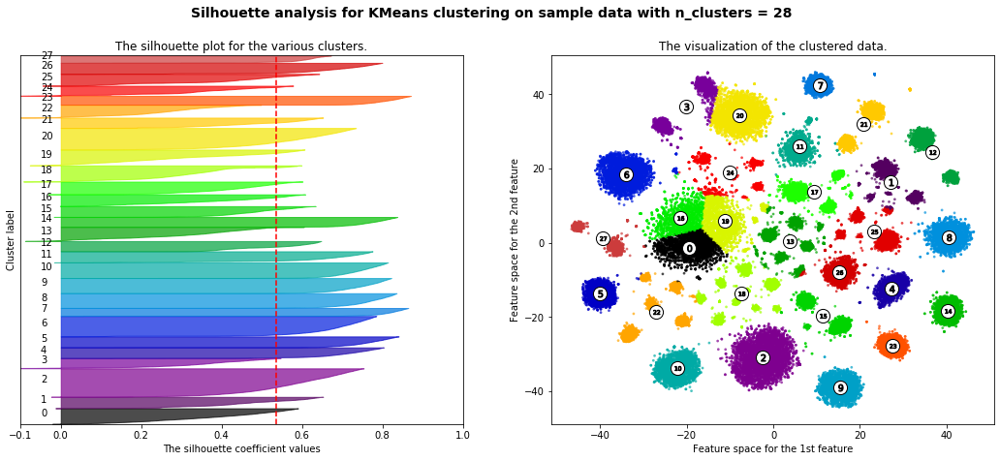

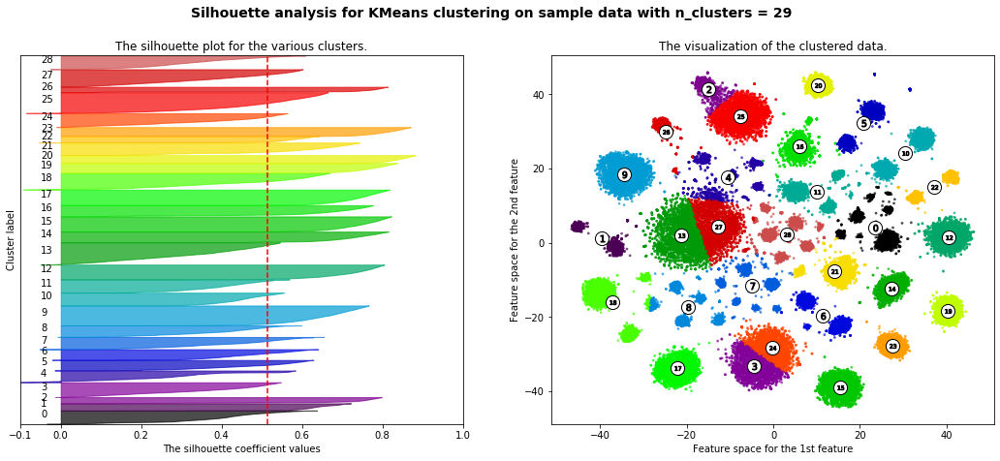

In [11]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,30):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing narrative

In [17]:
number_clusters = 28
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0       1    6874      09/09/16              Payday loan   
1       3   10840      08/07/15            Consumer Loan   
2       8   12248      08/07/16            Consumer Loan   
3       8   17162      05/26/16            Consumer Loan   
4       8   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030  17  222826      09/21/16  Bank account or service   
58031   5  142174      03/05/16  Bank account or service   
58032  17   55888      01/23/17  Bank account or service   
58033  19  293505      09/27/16  Bank account or service   
58034  17  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
wanted to receive information verifying that they had rights to my debt and they refused to send me a mailing they told me they sent out mailings and was before i moved to my new address they promised that they will no longer be calling me but taking it straight to legal action as well 

i contacted this agency in regards to this claim i was told by a representative that this account was listed in error the information on this account is not even my social security number so therefore was a data entry error on this agency s side i explained that this internal error was affecting my credit score i spoke to a supervisor and was told that they are unable to fix this issue and i must dispute this directly with the credit bureau i feel that this is unprofessional and that it is their responsibility to fix this error since they created it 

i have a a unverified account from credit management lp this account i have never done business with credit management lp pursuant to t

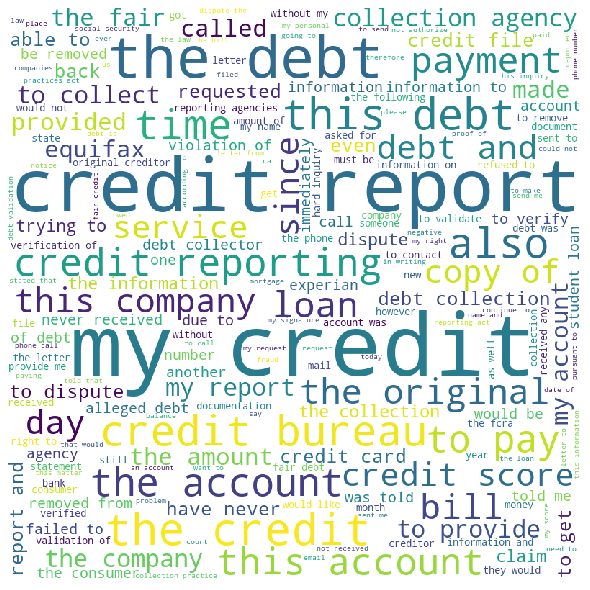

Cluster number: 1
the cardholder passed away on numerous calls to target card services and mailing and faxing the death certificate to texas is not helping they keep sending a bill to our house make toll free calls etc this morning i asked to speak with a supervisor who simply transfered me to another agent the agent acknowledged they have received the death certificate there is no estate and other companies have written off the debts this company keeps calling us and sending bills even though we have done what they asked of us to submit a death certificate 

my husband and i were recently in and while can be challenging at times due to mostly banks concerned over fraud my paypal overstepped their bounds my problems with them started when i got a new card from them with my name change due to marriage not one transaction has gone through since i received my new card with my new last name even though that same they upped my limit fast forward three weeks and while in i wanted to use the 

Number of entries: 1700


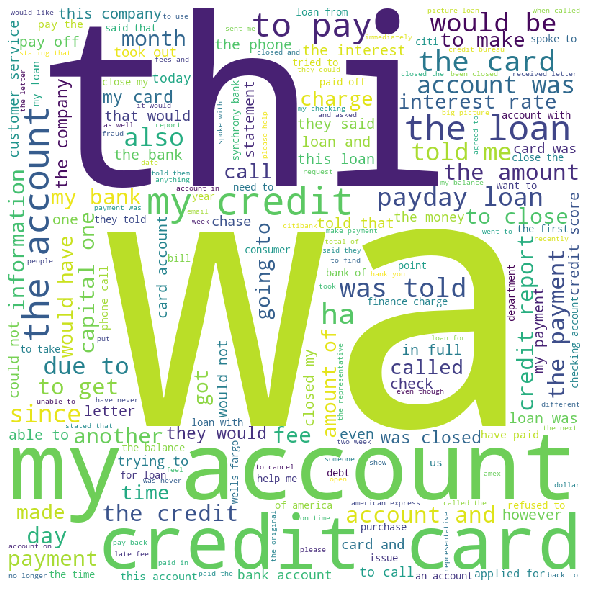

Cluster number: 2
since circa i have been an updating barclay credit card holder with upstanding credit paying not just the monthly due increments but at times the entire account balance at once so much so that they raised my credit from the initial to several months ago i made regular automated payments as usual due to a dispute i filed to prevent a fraudulent transaction from my source bank with which i paid off my barclay credit card they temporarily froze my account which reversed the payment to barclay once month i received a payment confirmation and no word from barclay that there had been an issue with payment via email or mail in i received a letter from barclay stating that my cardaccount was closed i immediately dialed their customer service line spoke with a female specialist and she stated that if i were to pay rather than keeping it closed and going on the hardship program which would reduce my interest rate and monthly payments dramatically she d reverse the reversal fees

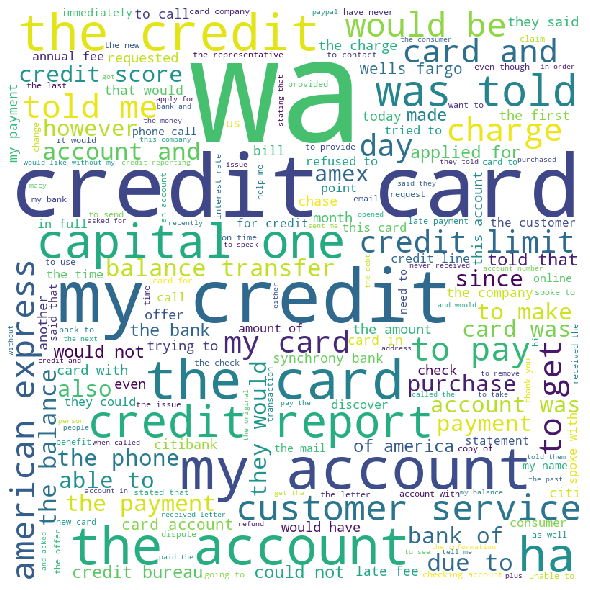

Cluster number: 3
we talk auto lender to extend time to pay my monthly payment and thay agreed but before time thay repo my car

i have been dealing with issue after issue with danco financial it is not my intention to write a report on them every time there is an issue but these are significant issues that have vastly affected my life and my every day activities in i was given a loaner car from via danco because of the problems i was having with them and another vehicle that i had financed the day before i returned the car i was pulled over three times in the loaner vehicle i was given tickets for no tag there was a tag that said but no date for no registration the loaner vehicle had n t been registered for years and for no insurance if the car was registered through the dealership my insurance would have covered it from the first officer who told me he was supposed to give me tickets impound the car and take me to jail but he did n t because it was obvious that the car was n t stolen

in i was unable to pay the mortgage i had a bad renter that i had to evict and the situation drained our savings to keep paying the mortgage we have small children and we ca n t choose chase over our children i called chase bank to let them know the situation and to see if i could make a few smaller payments to get caught up again i had also called them prior to the missed payment letting them know i may not be able to pay if we could n t get a renter in place in time they said they could n t help unless i was days late and would n t even talk to me about any options after i missed the payment i hired an attorney to help at this point chase told us that they would not issue any late fees or report any late payments to the credit agencies they honored that for a few months then the late fees started and so did the reporting to the credit agencies they keep reporting that i m days late with each payment but there has only been one month that i was late because i did n t have the money to

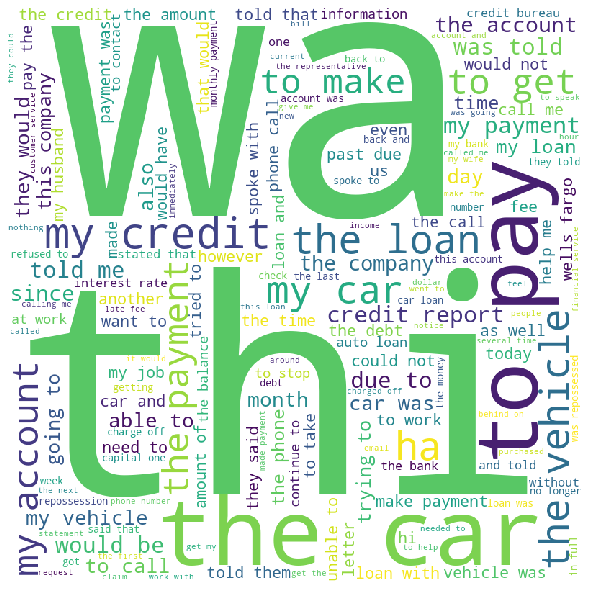

Cluster number: 4
hello there commercial loan office from rabo bank had contacted me her name is to refinance my commercial property she made all kind of promisses of course not a single one came through loan amount closing cost she ordered the apprasail i paid for and volunteerly sent me a copy of the report witch i ve never asked for called and told me oh i have thee best news you have the value and we are moving forward two days later she calls and said oh we only can do not i go why she goes just because i said no just return my appraisal fee i have the value i have the credit its your problem not mine her manger steped in and said if i move forward with the transaction they will credit me the i said ok i was contact by the escrow office to set up a signing appointmet i asked her about all the term of the loan come to find out that i would have a years witch no one had disclosed that to me 

dear sirs my uncle received in to his us mailbox in united states obviously through usps un

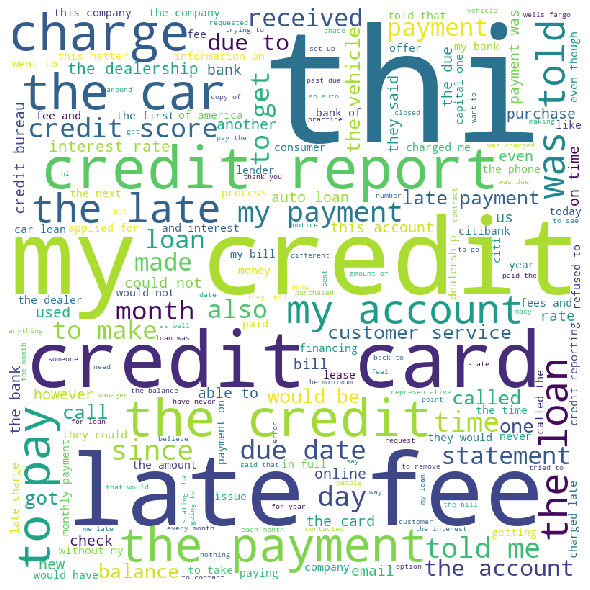

Cluster number: 5
i initiated a money transfer on from my bank account to bank account in my understanding was that once i was doing the wire transfer to usforex bank i provided them all the information they asked for who am i why i am sending the money who am i sending the money to etc with addresses and account information the money was reached in on it just sat there until i reached out to them and asked them to release it usforex did nothing but wait i even got them the release of funds wire transfer reference number from and they are still suggesting that it will not go out today and it was around way before the cut off time 

 synchrony bank line took the class action settlement refund out of my account they altered my credit line in order to regain the payment credit i received example credit line was posted credit for court settlement then reduced the credit line to essentially taking it back the refund account in good standing no missed payments always on time etc there seems 

Number of entries: 1876


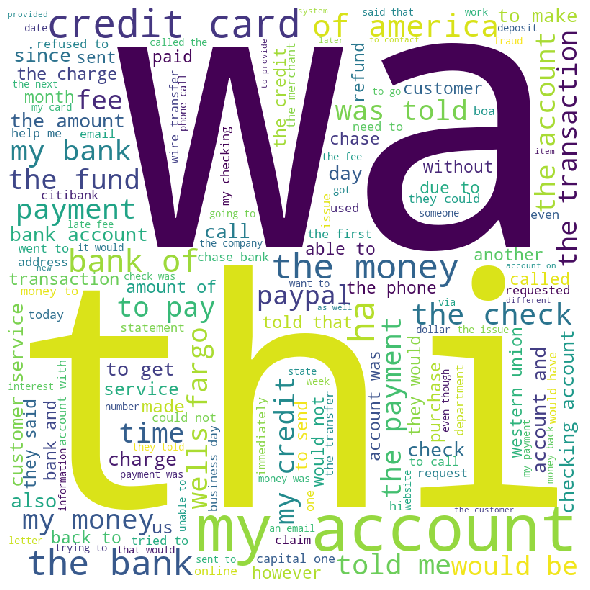

Cluster number: 6
they will not even talk to me because there is stuff on my report that i can not answer the person even admitted they do not check the stuff they put on my report how can i fix this if i can not despite it

i currently have an account on my credit report from that i did not authorize to open with a current balance of that has been sent to collections the reason this account was sent to collections is because i was informed a payment was never made on this account from the day that this account was opened because i never authorized the account i currently have been having service for over two years now and did not authorize this account to be open i did contact to inform them that i did not open this account nor did i ever contact them to have this account opened did inform me there was nothing they could do for me i need this removed off my credit report due to i did not authorize for this account to be open under my information

dpt of treasury put charges that i pai

Number of entries: 3967


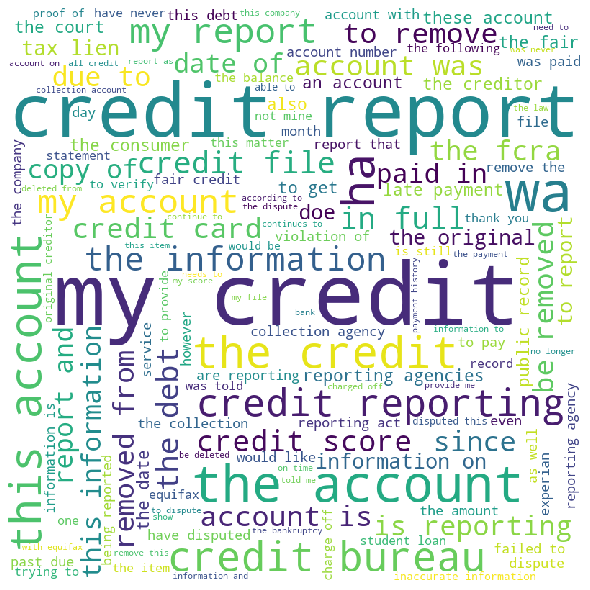

Cluster number: 7
i have established credit with macys since my credit limit was and rarely did i ever spend more than in any given month nor do i use the card monthly nor did i use it at any other store but macys yet on macys allowed a woman to call up their customer service from and in call raise my credit limit to change my address change my email since when do emails change too my phone number and the overnighted a card to her in to begin using which she did on friday macys called me to tell me that someone had attempted to change my address but because they were unable to answer the security questions it did not happen and they were just notifying me that she did have my name date of birth and the last digits of my soc sec as a courtesy she also gave me the address that my card was changed to in because it appeared my information had been compromised i filed a police report the police officer had additional questions and requested that i call macys back to get these answers at the

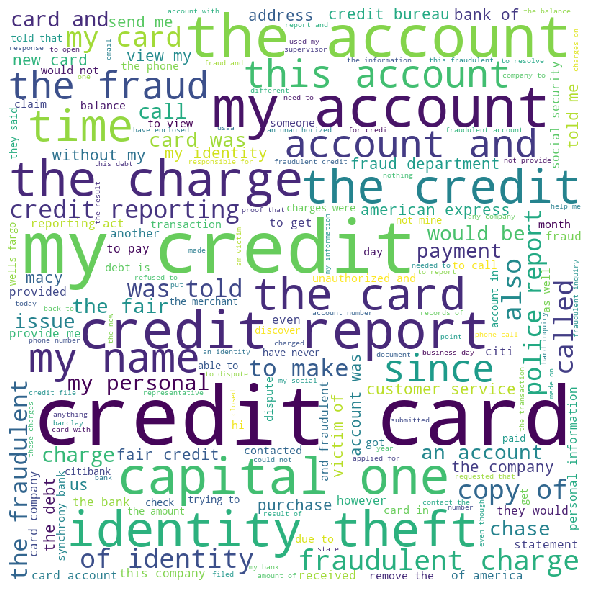

Cluster number: 8
this account was paid in full since they have yet to update it as paid in full and closed to the credit bureaus the late payments are also incorrect i have been on time with payments since 

 terminated my lease early because i was eligible under the pull ahead program and entered into a new lease part of the program was that i do n t have to pay remaining payments early termination fees or other fees and taxes received alert from credit bureau that i have defaulted on my auto loan for the terminated lease i called hyundai finance right away and the credit issue has been taken care off i was told that i was processed incorrectly for the pull ahead program but that account review is a manual process and it typically takes days and i will hear from them five more calls later and after speaking with many individuals in the same department i have not yet received an update the marketing department has to approve it there is nobody they can transfer me to or provide contac

i submitted a debt validation to this company under the texas finance code section which requires a debt collection agency to provide specific information within days this company although responded within the days did not provide the requested information they only sent lease form and a claim form it did n t include original date of non payment with creditor date debt was transferred from original creditor and the texas surety bond information per texas law this is to be removed from my credit report immediately also this company threatened to garnish my wages and report me to an attorney which is not allowed in the state of texas 

i received several credit alerts through credit monitoring that there was negative info being reported by ally i called them and they said they were not reporting anything negative after pulling the credit reports they show current status as contact for status but with all payments through paid as agreed i also paid my payment a week early creditors are co

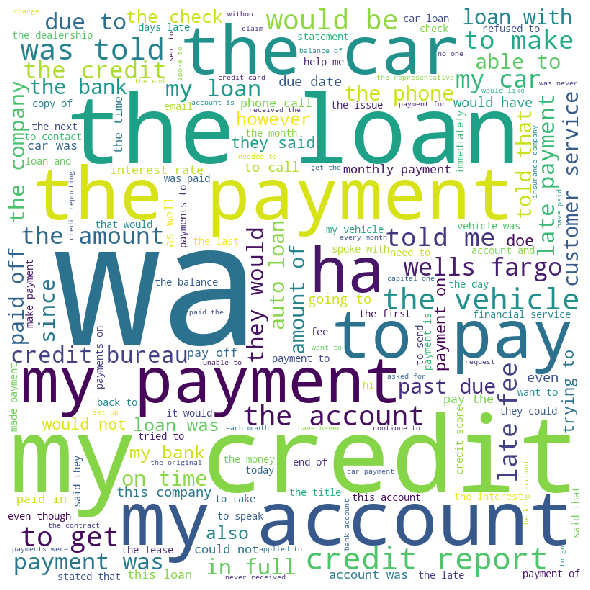

Cluster number: 9
i applied for bank of the west checking account promotion online since they were offering credit i completed all requirements to get the bonus and to my dismay i was denied claiming another house hold rep received a bonus this year i called bow customer care and spoke to someone right after acct opening and these guys are not organized and only specialized in wasting valuable customers time i asked customer care rep if i qualify for the bank promotion that i applied i was told that i am qualified and i need to wait until to receive the bonus and they never told me that i am not qualified since another house hold rep received a bonus this year which is not true i am checking my tax returns for last year and i do n t see a interest income statement from bank of the west and i do n t have any promotion applied to my account this year either same is true for my wife since we file taxes jointly and no other household reps lived at my house 

i signed up for a citigold pers

i had an checking account with key bank and i received signup bonus the account is now closed i still have n t received from key bank i called key bank the agent told me that they do n t have any tax document for me if i do n t that i might be in trouble when i file income tax 

Number of entries: 961


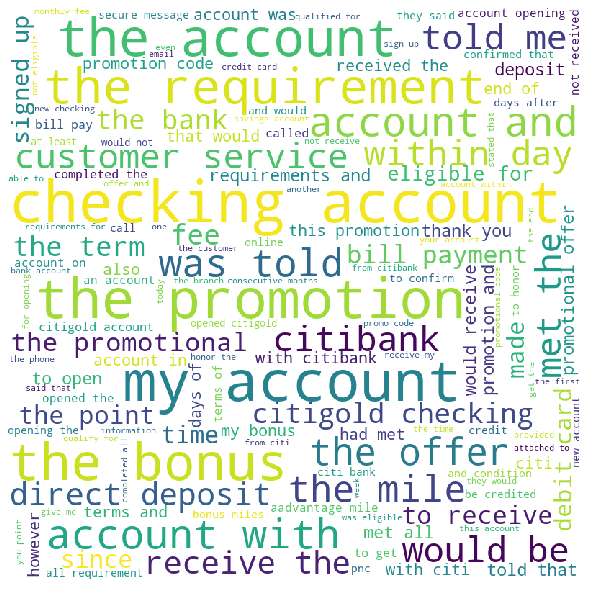

Cluster number: 10
a few months ago my daughter wrote to the consumer finance protection bureau about santander and i wanted to put my two sense in too because santander is an awful company it preys on disadvantaged people i am on a fixed income i no longer work because of my however i had a need for a car because transportation is very limited in ga so when i was approved for santander i was naturally happy until i realized these past years what they have been doing to me and many others like me most importantly i am writing this email because while rifling through my paperwork i noticed that the contract i had for santander does not match my car i requested had my daughter to request a copy of the original contract from santander a month ago and i have yet to receive a copy i think they are aware of their error but continue to collect money from me for a car that is worth less the only paperwork i have does not match the car i have it was a while back and maybe i am mistaken but i wi

the problem is with gm financial and the difficulty i m having with the company applying the funds that i sent before my first regular monthly payment to principle only according to what i read from the company s literature all funds made previous to or after a regular monthly payment or simple interest payments would automatically be applied to the principle i also spoke with a representative who pretty much said the same thing before i ever made a payment in the month of i paid a total of on my car loan to date my monthly payment has not changed even though i paid over my regular monthly payment the months owed on the loan was corrected to show that i now owe for that s it at first when i called i was told that the situation will be corrected the last time i called i was told that my payments would stay the same and the months i owed would stay the same what i had been doing is basically making early payments when i email but get no response snippet of email sent to gm financial i ma

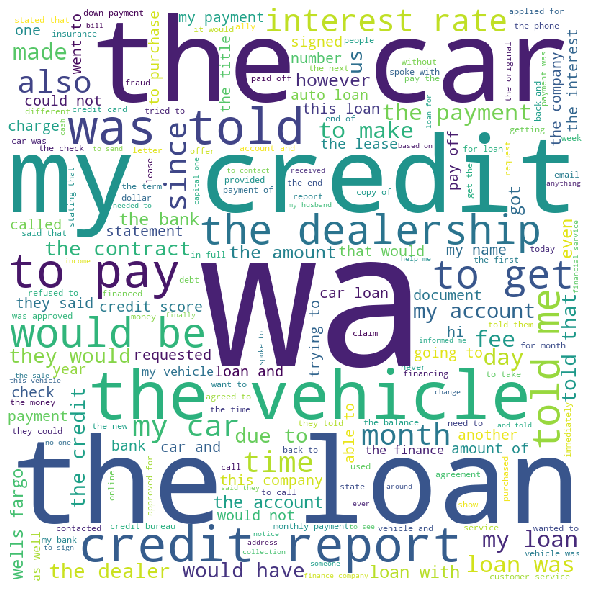

Cluster number: 11
a loan was done and paid in full i wanted to pay in full and called to make the payment over the phone i asked what the amount was in full that needed to be paid i paid and asked if this was final and closed the person i spoke with said yes paid in full today i received a call from a collector on behalf of ace saying i owe money plus legal fees i paid in full why do i owe them money the lady i spoke with said well who ever you spoke with when you made the payment didnt close the account now they are saying you owe them money what do i do i have the bank statement for the amount i paid i was told on the phone that payment was in full 

i am with we are closing down the bank account to stop them from damaging us further the name of the company is quik cash in kansas i made payment arrangements with them and was late on that arrangement at the time of the pay arrangments they were supposed to have shredded the original check for apparently they never shredded it even th

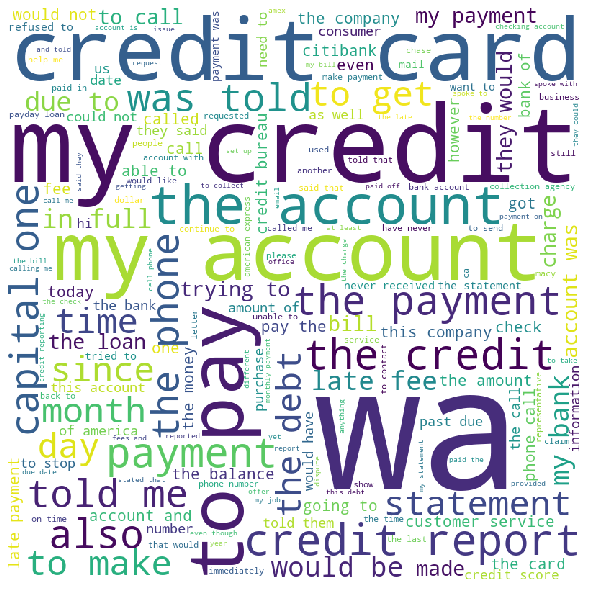

Cluster number: 12
i recently submitted a complaint against ocwen my second complaint against them through the cfpb due to an escrowpayment increasenotice issue i realized today that after i submitted the complaint to the cfpb ocwen chose to reverse my previous loan payments i called ocwen to find out why these payments were reversed and they could n t tell me why they did assure me that the payments were reapplied to the account however according to the customer online payment history through the ocwen website it does not show the payments were ever reapplied an escrow review should not require a multi payment reversal i feel as though ocwen is retaliating against me for making complaints against them to the cfpb i have never missed a payment and do not know why ocwen continues to make things difficult for me to ensure my account is serviced correctly i am and i am even having a difficult time figuring out what is occurring and why action is being taken on my account in my professiona

on we purchased a single family home in texas with an fha insured mortgage from mortgage in to we were apprised that had sold the mortgage to wells fargo home mortgage earlier this year we were able to qualify for a lower cost uninsured mortgage again sourced through mortgage the mortgage in required that we escrow the year of property tax and insurance and escrow of the year s property tax and insurance obligation each month in when we procured the new lower cost mortgage we should have received all of our escrow monies back from wells fargo wells fargo did not return all of the escrow monies wells fargo in phone calls say you escrowed when you closed on the purchase so we based our return on that number however by the time wells fargo purchased the mortgage we had increased the escrow by another at least in fact the wells fargo escrow statement shows that when they took over the mortgage in the escrow was despite their acknowledgement of this discrepancy they have not return the moni

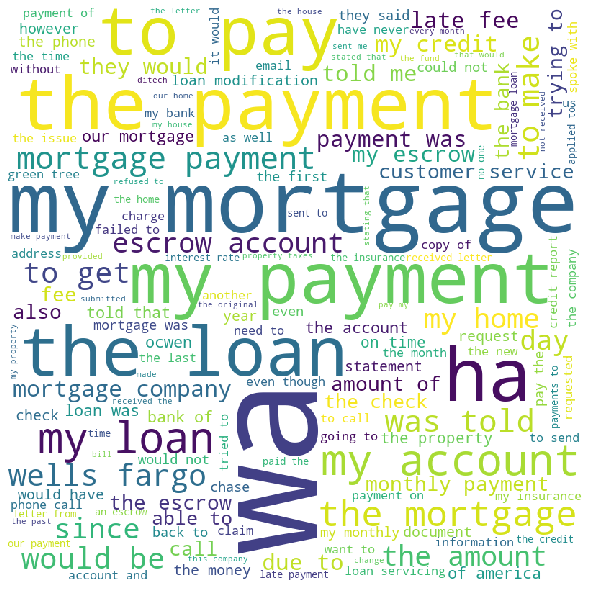

Cluster number: 13
i was enrolled in for the semester of i was found ineligible for the and financial aid was declined so i had to drop out of my classes and leave school i am now being told that the loan was paid and i owe the money my transcripts will prove i did not attend school during this time and i would like to see what recourse i can take against because since they have reported me as being delinquent i my credit score has began to decline and it has lessened my financial capabilities 

navient continues to try to collect a full payment monthly by requiring me to reset the online payment amount shown on their website on a monthly basis in order to pay the agreed upon income repayment plan amount i can not enroll in the automatic online repayment or the full will be taken from my bank so every month i pay manually online by going in to reset to the lower amount prior to submitting my payment i asked navient about this and they said i ca n t remove the higher amount so i tried p

my student servicer was the pennsylvania higher education assistance agency fedloan servicing i paid off the balance of my student loans prior to my final payment i was able to view my payment history and accrued interest on the fedloan servicing website however after my final payment was processed my online access to this information was removed and i was provided the following message we re sorry the feature you requested is not applicable to your account i was not informed by fedloan servicing that this information would no longer be available i recently started my taxes and i noticed that the student loan interest received by lender reported on my form appears dramatically lower than i would have estimated since i no longer have online access to my payment history and accrued interest i can not verify the amount on my form i called fedloan servicing and the representative stated that he was unaware that this information was removed following final payment i requested a copy of my f

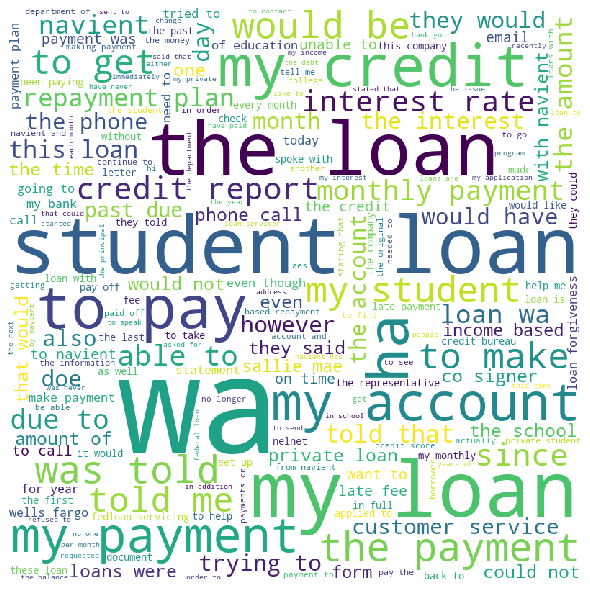

Cluster number: 14
i did money transfer to a bank account using western union on the money was never received by the receiver after that i called more then times to western union to request the refund on this transaction every time i was assured that they have submitted a request for the refund and i should hear back in hours they never called me back and every time i call they keep telling me that someone will call me back within hours and no one calls back on i spoke to a manager name operator id and she assured me that she will call back in hours which she never did i would like to receive the fund back via check mailed back to my home address 

us bank gift card sold at bank for flat purchase fee of buyer assured no additional fees for use terms and conditions claim no user fees no hidden fees no other fees for transactional use of the gift card accepted wherever visa accepted card purchased at bank cash loaded plus after card gifted user tried to buy food at a bakery then grocery 

Number of entries: 1026


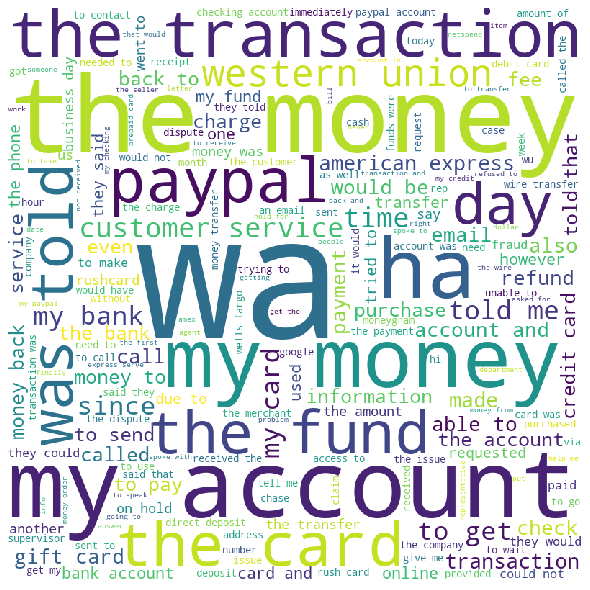

Cluster number: 15
my husband and i refinanced a loan with using quicken loans as our new lender this was a loan executed in ny our closing with quicken was on i received the updated closing packet from quicken on two days after the loan closed which meant i had no accurate documents to review that referenced costs at the closing we were told we owed a check to which is an affiliate of quicken apparently quicken controls the title company and the appraising company on their loans and sends a disclosure for same in the amount of for interest which i thought was odd since there should have been enough money available to cover all costs and the closing documents we did receive stated we would owe we cut this check for at the closing when i received the proper closing package on two days after the closing i sat down to prepare a closing statement and realized what went wrong also please note no copies of any checks cut by us or by the lender at the closing were provided quicken had used th

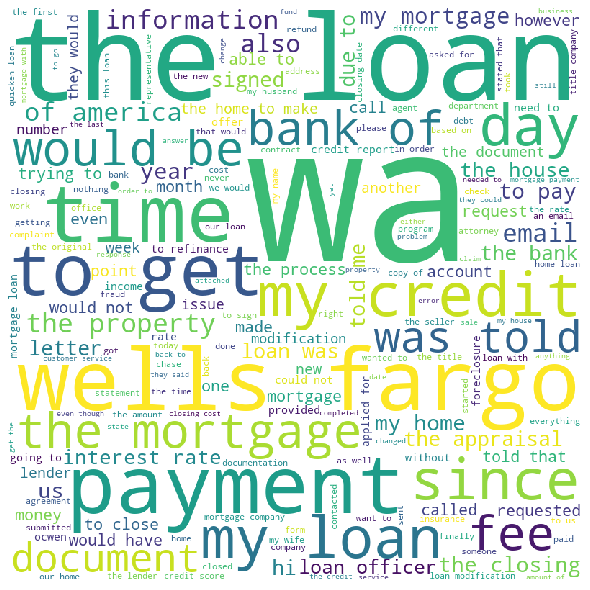

Cluster number: 16
to whom it may concern i applied for a mortgage loan with regions bank i was pre approved and permitted to house hunt i was pre approved after submitting all the usual documentations bank statements tax returns pay stubs and so forth a month later i found a property and submitted further documentations since it was a condo i then received a commitment letter from my bank i was then set to close on thinking i will be closing my bank finally contacts me stating they need bank statements since they never received them this makes me question the following how did i get pre approved without that is n t that bad financial practice did they lose my documentations which has severe personal information is n t this also bad financial practice with this said i then had to drive hours to to hand deliver this bank statement instead of email or fax because i no longer have trust in regions bank and its team my closing date was then pushed back to due to other issues of documentati

have been in a foreclosure for yrs mortgage company finally foreclosed because of fraudulent docs i have proof of fraudulent promissory note as well as fraudulent deed of trust finally the mortgage company got the documents it needed forged they never had a valid deed of trust with proper signature or a promissory note with proper signature but hey got this papers forged i have papers where the notaries stamps are marked out i have papers that state the note was lost and they are adding in a blank note which is illegal i need help to stop the sale of my property which is up for sale on i cant take this case back to superior court and the board of appeals will not consider any new evidence in this case so i would like for criminal charges be filed against the attorneys and the judge that handled this case but i fear for my life as well as my family based on a case that was filed against a judge and mortgage company out of the judge that ruled on this case in the person he ruled against 

Number of entries: 1921


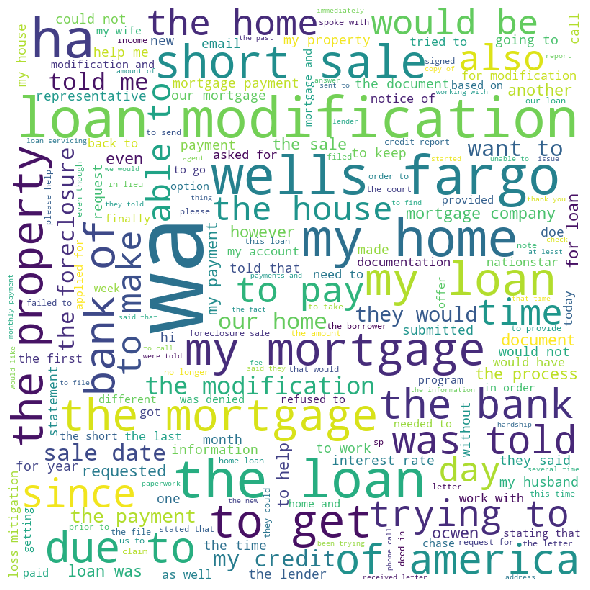

Cluster number: 17
this complaint is against bank of america in north carolina my father died on i am the executor of the estate the court in nc is requesting the balance in his bank account on the day he died sometime in i called boa i was told i could pick that info up at any branch i told them they closed all the branches in and the closest branch is a half hour away and could they just mail it to me they said yes i should get it in a week i had not received it after weeks so i went to the branch i was told i would receive the info within the week about a week later i received a letter stating an authorizationinstruction letter is required in order to process the request i called the number to see exactly what they wanted boa said they must have the request in writing on i went to the branch the associate there was very helpful she faxed all the info requested by boa including the death certificate and letter of testamentary which they already have on file she called the estate depa

i have several accounts at ally bank ally bank does not have a relationship with but that program was able to access data from some but not all of my accounts i reported this data breach to ally but they were unconcerned even though they could not explain why of my several accounts were accessible 

i have repeatedly asked wells fargo to stop sending me marketing materials regarding my hsa and they keep on sending them to me 

on i went into bank of america located on in texas to open a savings account while pulling up the computer screen then associate told me that i had an invite to open up another credit card account with bank of america after completing the paper work for my savings account she filled out an application for me for another credit card i was denied i found it very strange because bank of america had been sending this invite to me very frequently since last year after returning home i decided to call the bank and ask them to review application and asked them why i was

Number of entries: 3311


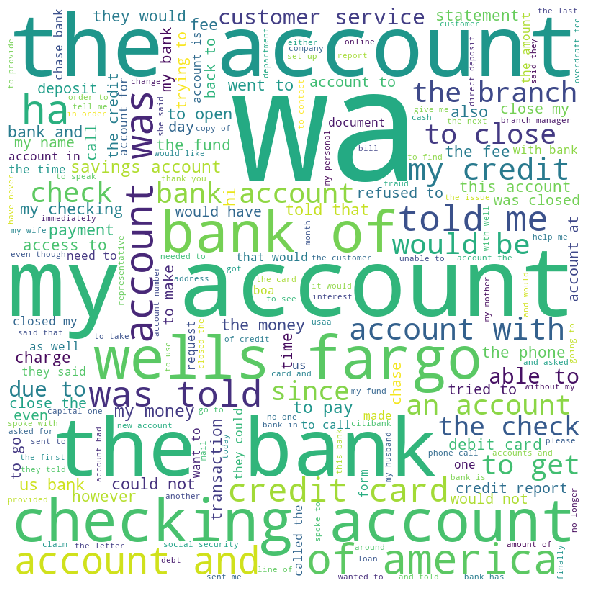

Cluster number: 18
i am filing a complaint because equifax has ignored my request to provide me with the documents that their company has on file that was used to verify the accounts i disputed being that they have gone past the day mark and can not verify these accounts under section a of the fcra they are required to promptly delete all information which can not be verified that i have disputed please resolve this manner as soon as possible thank you

i talked to aes american education services a couple weeks ago on the phone about how they can help me with my student loans when i spoke to them they said they had payment options to help me i called them today to set up of those payment options and they stated they ca n t help me that i used all the options that i had available it is very conflicting on the information that they are giving me i really want to keep up with my payments but aes is taking me in circles 

 forced me to take this loan back in the original amount was and it 

Number of entries: 1333


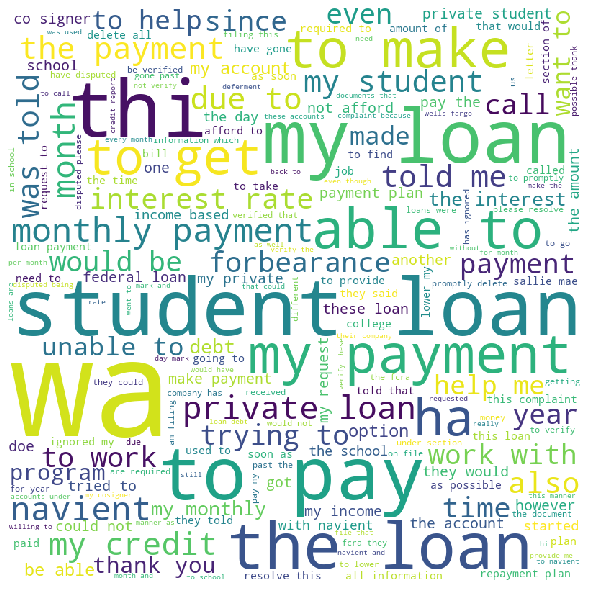

Cluster number: 19
my bank is wells fargo and there always seems to be a problem going on in my account some of the bank accounts were opening separate accounts and moving money from account to the other that a reason why my funds are low i do n t want to move my money from account to the other i want to solve this issue right away i want a suggestion to see if there is a good online bank has great customer service that is recommend to move my funds there i would appreciate a response 

i used my paypal account in late of this year to make different transaction withdraws from my bank these transactions were being sent to different places paypal dipped into my account and took out each transaction when i saw that paypal had taken money out of my account again days after the original withdrawal i called paypal and asked that they simply refund the extra payments they removed without my authorization back into my bank account they said they would have to look into it well paypal tried to 

on my company gave a check to a tenant as a refund for the deposit that he did when rented the apartment to the company he cash the check sending a picture to his bank on and my bank citibank paid the check he sent again the check picture on and it was paid again by my bank he sent again the same check on and it was paid again on was paid again on was paid again on was paid again on he altered the number of the check but only on the top right side not at the bottom and it was paid again on he presented again the check and was paid by the last time in total the same check of was paid times by the bank i think citibank fail in their responsibility of checking that the check number was paid before and the check number was repeated times the check number was altered and the check were expired and paid after month of the date in the check after presenting a complaint in citibank when i discovered all of this when i was preparing the report to pay taxes al they oficially didnt answer up to n

on i went to citi bank to cash a check that was draw on citi bank the teller ask for my identification social security number and job title to cash a check just for clarification in order cash a check and you do not have a check is what because i do not have a checking account do that give them perimission inquiry into my personal life social security number is piv confident item 

the bank in question is first national bank located at tx the bank has put hold on my funds in my business account in name of i am a customer bank never issued me hold notice when deposits were made or even on next day as required by reg cc the deposits are now to three weeks and are collected as i understand this hold was an afterthought i was told that the funds will be held for days with out mentioning from which day and irrespective of when it was deposited i believe that this is not with the reasonable timeframe of reg cc the bank confirmed that funds would have been collected by now that eliminates the

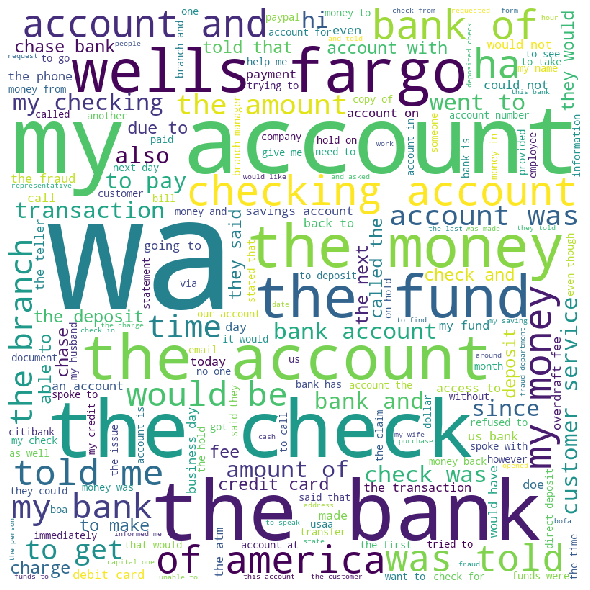

Cluster number: 20
in a fixed apr of was offered to me by the person who opened a credit card for me with first citizens bank i received an activation letter with the credit card enclosed confirming the apr letter enclosed i transferred a balance to this card there as been to other transaction on this card since it was opened there as never been a late payment the credit card company is now billing me at the rate of i had conversations by phone with the credit card company on the morning of i was told in both conservations that the credit card company has no record of my rate ever being a quarter percent here a quarter percent there adds up to millions think that is why they ca n t find the records 

recently i talk to best buy credit card about the interest charge almost dollars where from they say first i have a late charge i said i talk to your customer respentive they say will take care for me i say i pay full amount for last statment why i have interest charge they said because th


capital management services called my home and left a message that i needed to call them back about a debt that was in collections i have no such debts so i called them back and told them that i know that i do n t owe money and that they had no business calling me they then asked whether i knew a supplied name i told them that it is illegal to call party about another party s debt and that i would be lodging a formal complaint with the cfpb the woman got snippy with me but said they would remove my information i wish to make absolutely certain that that happens as i do n t trust these louts 

cmre financial services reported to a debt of which is not mine i called and gave my date of birth which they said does n t match the original medical bill but they demand my drivers license and other documents to correct i feel this is not or and it is their duty to remove such libelous report knowing it is not my debt i offered to at most provide a redacted copy of my driver s license i plan to

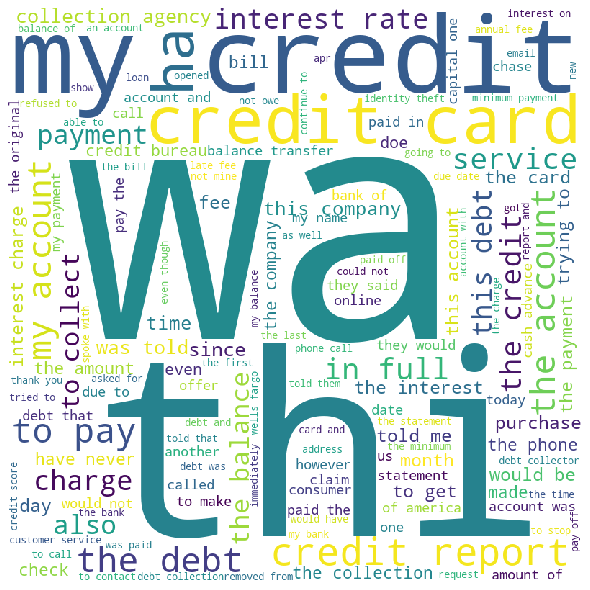

Cluster number: 21
a company called concord resolution keeps calling me to collect on a payday loan from that was paid in full they are very rude and disrespectful and have my personal information 

i recieved this from a supposed debt collector stating arrest warrant id which is going to be released on wednesday attention this would be last and final warning for you this legal proceedings issued on your docket number with of company in order to notify you that after making calls to you on your phone number we were not able to get hold of you so the accounts department of has decided to mark this case as a flat refusal and press legal charges against you case no amount outstanding we have sent you this warning notification about legal proceedings of but you failed to respond on time now it s high time if you failed to respond in next hours we will register this case in court consider this as a final warning and we will be emailing fax this issue to your current employer to make sure th

discover close my account on this i have cash back and redeemed as staples gift cards however i did t receive dollars gift card and contacted discover on the agent told me it need to take weeks to investigate ok and then i wait and contacted them lately more than two months the agent just told me they wont replace it and specialist would contact me in hours unfortunately no one contact me again until i called back told me discover made a decision and not replace that to me i see a bad customer attitude company here and i wan na everyone know how discover treat this customer i requested to have my staples gift card back 

around i received credit card offers under my company name from chase financial services as i was president of the corporation the cards was in my name as well as the corporations name all purchases on the cards were company related purchases no purchases were ever made by me for anything personal as a result of the financial crises beginning in my company which had be

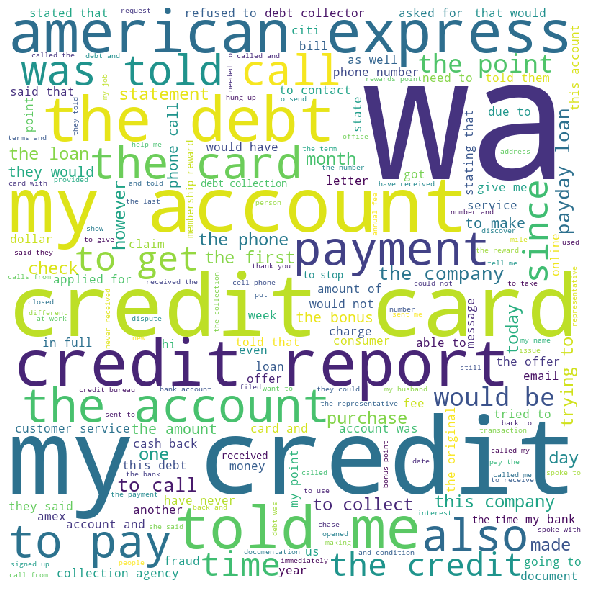

Cluster number: 22
hello i was charged an overdraft fee in the amount of for a check i wrote to nj ez pass check on i had an ending balance of about in the account and there was a check i wrote for which was mistakenly deposited a day before it should have been so that caused the account to overdraw by about or so well fargo will say the checks are presented as they come in at the end of the day and they will lie and say the check for the dollars came first causing the account to overdraw they do their calculations at the end of business each day and items are pending allowing you to make a deposit so i clearly do not know how they can say they pay the items in the order they come in they do this all the item seeking to charge as much as they can in overdraft fees while i am greatful they honor my checks they should i have been banking with them for over years and they have been getting tremendous amount of fees from me in the last year or two when i am in the wrong i do not argue with

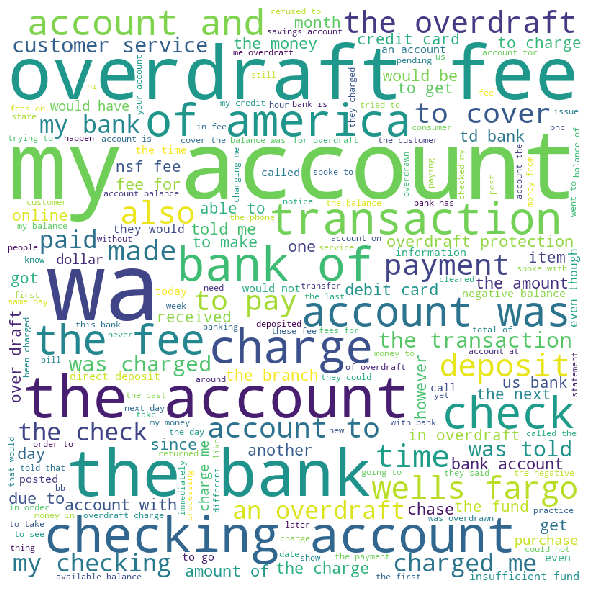

Cluster number: 23
 i recieved a phone call from an speaking person claiming to be from telling me that they have been alerted that my computer was corrupted they told me that the anti virus software that came with my computer was not strong enough to correct the problem and they got me to purchase another software for which i put on my suntrust credit card they gave me an number to call if i had a problem when i called that number it did not go to it went to another company i then called directly and told them what happened they told me i had been scammed and that these people had no connection to and to take the software they installed off my computer before it got further corrupted they said they would never call anyone saying their computer had been corruptedwhen i found out i had been scammed i called suntrust and told them what happened and they took the charge off my card months later in they put the charge back on my card saying it was a good charge since i authorized it even t

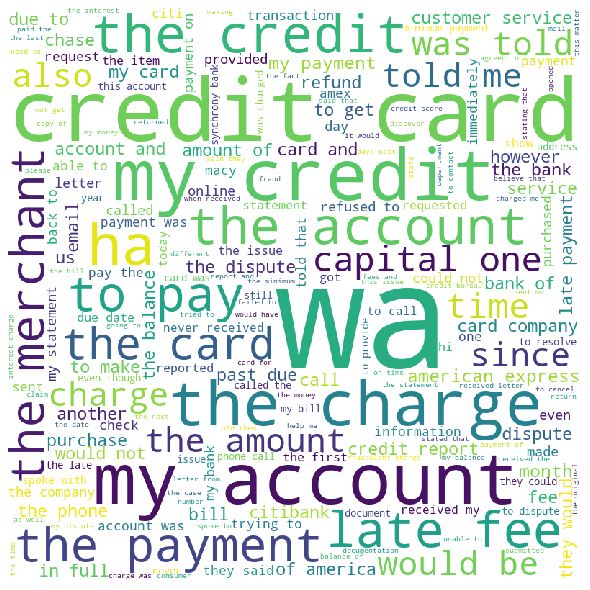

Cluster number: 24
received check fro capital one llc for no letter with explanation check says refund but also says expense check accounts payable called numerous people in capital one all clueless routing numbers on bottom are for capitol one na la guess its a scam but ca n t figure out how it works no money being asked from me 

i had a prepaid card issued to me as incentive from to purchase their services i the card was issued by citi i never used the card and infact lost it but i recently found a document with the account number and credit amount i contacted the issuer citi and spoke to several individuals who reported that the card had expired as of and the unused balance was surrendered as fees they would not re issue a card the last individual i spoke with told me that the card was issued in pennsylvania so for some reason the credit card accountability responsibility and disclosure act did not apply to them i m told that it is clearly in the terms and conditions for the use of

 no longer serves its purpose there is no way to easily get your credit report the way the reporting companies have set this site up what a shame a system meant to force private industry to be responsive to the consumers who information they make their profits off of has been infiltrated by the reporting companies and completely neutered of any relevancy a dnwe have the great folks in charge of regulating this at the ftc to thank thanks for doing your job for all american companies you guys really deserve a raise hint the american citizen has been tapped out already any raise you people get for doing absolutely nothing is going to have to come from your corporate overlords from now on 

experian will not give me my report on line i need it asap

i wanted to see what my score was i thought it came with the annual report and it did n t i should not have to pay to get score from annual report

i visit www annualcreditreport com i put my info in and it time me out when i went back to get m

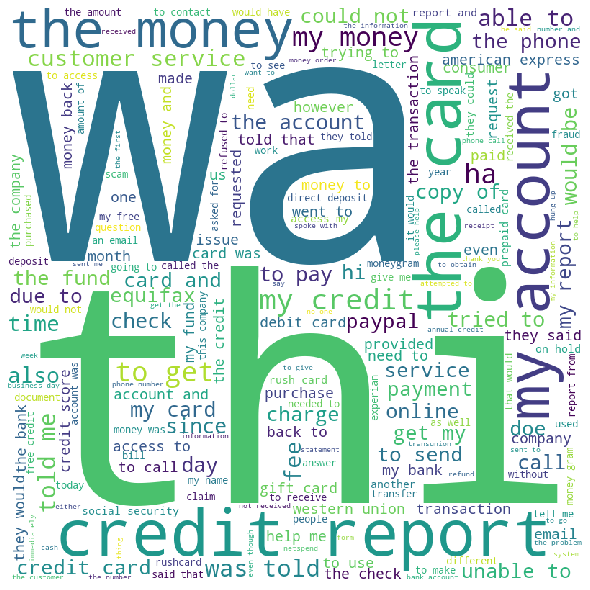

Cluster number: 25
i am disputing the hard inquiry from ny made on i have attempted to request of them to remove the hard inquiry since i did not initiate it they can not be reached as reports they have gone out of business therefore neither can experian to verify this is a valid hard inquiry that i requested which it is not therefore since the i contest it is not and have done due diligence by reaching out to the furnisher and they have nor can not respond i am requesting this hard inquiry be removed in accordance with federal law 

equifax froze my credit report without my permission or request they will not unfreeze it unless i provide a special identification number which i do not have because i did not request the freeze in the first place i need my reporting unfrozen so i can apply for a credit card and there is no way i can get equifax to do it my name is ss my address is ny my email is my phone number is please help 

i ve had way too many inquiries put on my credit report afte

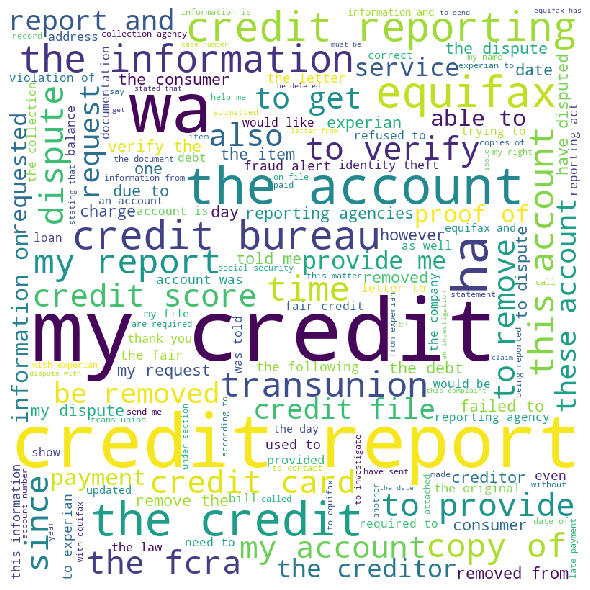

Cluster number: 26
this is my fourth time i am complaining about bank of america they have not done or helped me with the three first complaints and they once again hit with another late fee charge for what reason they transferred money from my savings to cover a charge on my checking and hit me with a fee for the transfer are you kidding me i rather stay then and then they hit you with an extended over draft fee or a transacting transfer fee this bank is a con all the way they help themselves not their customers who keep them in business i call for help and no one at bank of america can help you ever always excuses or we ca n t do anything or you reached a limit sickening i do n t make much money and my father just passed away and i am bleeding money and this bank is just taking the little bit i got left i got hit with all the funeral and hospital expenses and i have no money due to this bank i also got stolen from my account and this bank sti ll has returned my calls or returned my m

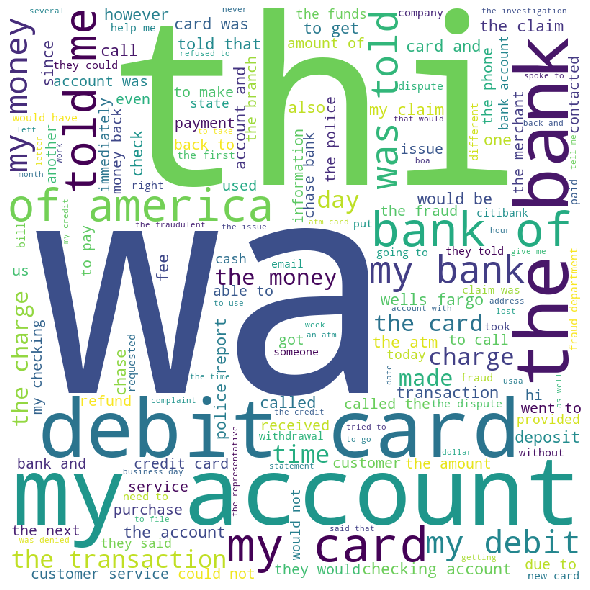

Cluster number: 27
i have not been able to access the reconsideration department for the paypal extras mastercard as paypal has automated the process i am trying to get rid of all connections to traditional banks and move all of my financial products online i really liked the way the paypal extras mastercard was set up and applied for it paypal s automated system declined me for any amount which i feel was unjustified so i attempted to reach a real life credit analyst so i could review the application with them paypal did not have any way of reaching this person through traditional means therefore i attempting to use the cfpb to have paypal s executive team look at my account and reconsider the card i have accounts with paypal my business and personal i have a paypal credit account tied to my personal account that has been in good standing and paid off on time every month i also have a credit card and credit card that have been paid on time each month i had some issues with my student 

i have requested the credit bureau to remove all derogatory credit reporting in reference to student loans that had been intiated by online division i have made this request based on the federal lawsuit that has been filed against parent company the lawsuit accuses the school of fraud i submitted the court case to the credit bureau and have requested provide all supporting documents such as promissary notes has neglect to do so and all credit reporting agencies investgated this as identity theft this os a deliberate misrepresentation of my dispute 

Number of entries: 3070


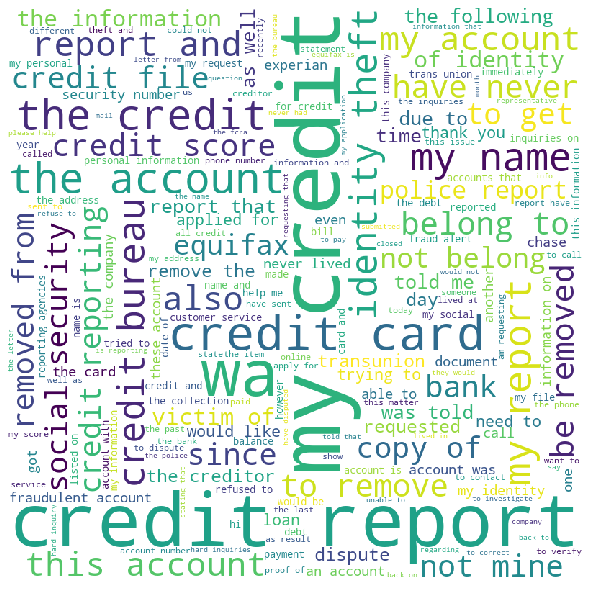

In [18]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,200)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 
